In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

Accompanying presentation slides: https://docs.google.com/presentation/d/1BD9TyzOI2NO2S94K0_M57328OL_evZ0Kb-6XJuVjmkc/edit?usp=sharing

Using wine dataset of UC Irvine

http://archive.ics.uci.edu/ml/datasets/Wine/

In [2]:
wine_df = pd.read_csv('wine.csv')
wine_df.head()

,label,alcohol,malic_acid,ash,ash_alcalinity,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,OD280/OD315,proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [3]:
X_df = wine_df.drop('label', axis = 1)
labels = wine_df['label']

### General EDA

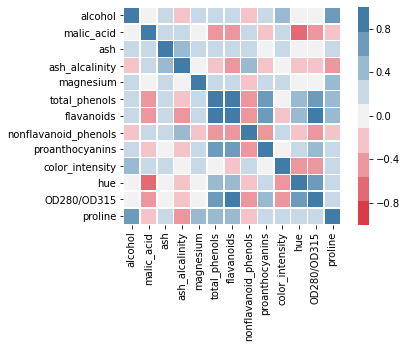

In [4]:
corr = X_df.corr()
sns.heatmap(corr, cmap=sns.diverging_palette(10, 240, n=9), linewidths=.5, square = True, vmax = 1, vmin=-1)
plt.show()

In [5]:
from pprint import pprint

d = X_df.corr().to_dict()
flattened_correlations = []
for key1 in d:
    for key2 in d:
        if key1 != key2 and key1 > key2:
            flattened_correlations.append((key1, key2, d[key1][key2]))
flattened_correlations.sort(key = lambda x: x[2], reverse = True)
pprint(flattened_correlations[:5])

[('total_phenols', 'flavanoids', 0.8645635000951156),
 ('flavanoids', 'OD280/OD315', 0.7871939018669513),
 ('total_phenols', 'OD280/OD315', 0.6999493647911864),
 ('proanthocyanins', 'flavanoids', 0.6526917686075155),
 ('proline', 'alcohol', 0.6437200371782138)]


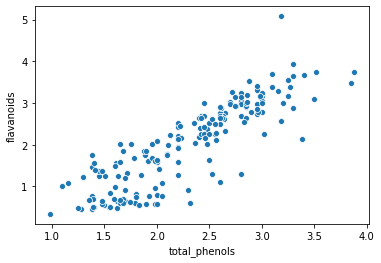

In [6]:
sns.scatterplot(X_df['total_phenols'], X_df['flavanoids'])
plt.show()

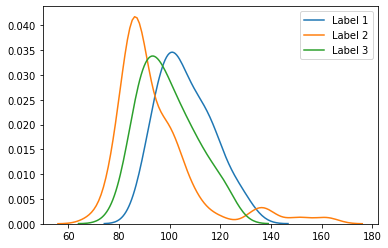

In [7]:
feature = 'magnesium'

for label in (1,2,3):
    sns.kdeplot(X_df[labels == label][feature], label = f'Label {label}')
plt.show()

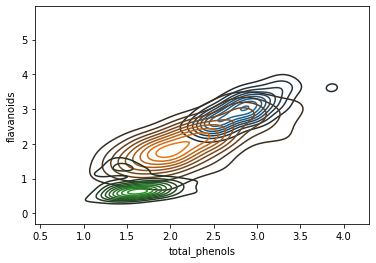

In [8]:
feature1 = 'total_phenols'
feature2 = 'flavanoids'

for label in (1,2,3):
    sns.kdeplot(X_df[labels == label][feature1], X_df[labels == label][feature2])
plt.show()

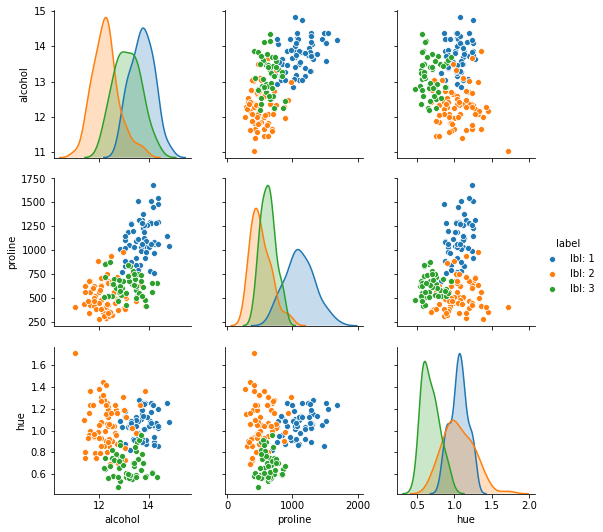

In [9]:
# String the label or else seaborn is going to treat it as a covariate
wine_df['label'] = wine_df['label'].apply(lambda x: f'lbl: {x}')
sns.pairplot(wine_df[['alcohol', 'proline', 'hue', 'label']], hue='label')

### Pandas Profiler

In [10]:
X_df_bad = X_df.copy()
X_df_bad['constant'] = 1
X_df_bad['uniform'] = np.arange(len(X_df_bad))

nan_array = np.concatenate((np.repeat(np.nan, 30), np.random.normal(size = len(X_df) - 30)))
np.random.shuffle(nan_array)
X_df_bad['missing'] = nan_array

X_df_bad['high_correlation_ash'] = X_df['ash'] + np.random.normal(len(X_df))

In [11]:
X_df_bad.describe()

,alcohol,malic_acid,ash,ash_alcalinity,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,OD280/OD315,proline,constant,uniform,missing,high_correlation_ash
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.0,178.000000,148.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258,1.0,88.500000,0.079454,181.747779
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474,0.0,51.528309,0.968805,0.274344
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000,1.0,0.000000,-2.190815,180.741262
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000,1.0,44.250000,-0.621077,181.591262
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000,1.0,88.500000,-0.059735,181.741262
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000,1.0,132.750000,0.683443,181.938762
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000,1.0,177.000000,2.894560,182.611262


In [12]:
from pandas_profiling import ProfileReport
profile = ProfileReport(X_df_bad, title="Wine Profiling Report")

In [14]:
# This glitches with %matplotlib notebook
# If it glitches, I would consider restarting the notebook and just running this cell.
profile.to_notebook_iframe()

### Feature Selection Algorithms

In [13]:
from sklearn.feature_selection import SelectKBest, chi2, RFECV
X_noise = X_df.copy()
for i in range(5):
    X_noise[f'bad_feature_{i}'] = np.random.normal(size = len(X_df))

for c in ['hue', 'alcohol', 'flavanoids']:
    X_noise[f'redundant_feature_{c}'] = X_noise[c] + np.random.normal(0, 1, size = len(X_df))

In [14]:
best_features = SelectKBest().fit(X_noise, labels)

In [15]:
sorted(list(zip(X_noise.columns, best_features.scores_)), key = lambda x:x[1], reverse = True)

[('flavanoids', 233.92587268154838),
 ('proline', 207.92037390217828),
 ('OD280/OD315', 189.97232057888206),
 ('alcohol', 135.07762424283948),
 ('color_intensity', 120.66401844100372),
 ('hue', 101.31679539029965),
 ('total_phenols', 93.73300962036775),
 ('redundant_feature_flavanoids', 54.55180721222909),
 ('malic_acid', 36.94342496318376),
 ('ash_alcalinity', 35.77163740730817),
 ('proanthocyanins', 30.27138317022791),
 ('nonflavanoid_phenols', 27.575417146965727),
 ('redundant_feature_alcohol', 18.265011250328502),
 ('ash', 13.312901199989989),
 ('magnesium', 12.429584338150178),
 ('bad_feature_0', 2.3921273433128802),
 ('redundant_feature_hue', 2.320363671345864),
 ('bad_feature_2', 0.5296330136279496),
 ('bad_feature_1', 0.46181971979304637),
 ('bad_feature_3', 0.19168469239239794),
 ('bad_feature_4', 0.026519841451869322)]

In [19]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
trainer = RFECV(LogisticRegression(), cv = 10)
X_scaled = StandardScaler().fit_transform(X_noise.values)
y = labels.values
fit_results = trainer.fit(X_scaled, y)
print('n_features selected:', fit_results.n_features_)

n_features selected: 8


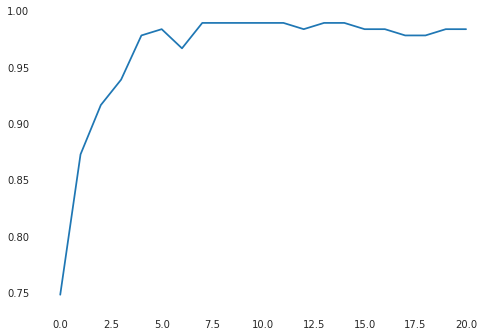

In [20]:
plt.plot(fit_results.grid_scores_)
plt.show()

In [21]:
# Magnesium
removed_features = [feature for feature, include in zip(X_noise.columns, fit_results.support_) if not include]
removed_features

['malic_acid',
 'magnesium',
 'total_phenols',
 'nonflavanoid_phenols',
 'proanthocyanins',
 'bad_feature_0',
 'bad_feature_1',
 'bad_feature_2',
 'bad_feature_3',
 'bad_feature_4',
 'redundant_feature_hue',
 'redundant_feature_alcohol',
 'redundant_feature_flavanoids']

### 2D Visualization

In [22]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

<IPython.core.display.Javascript object>


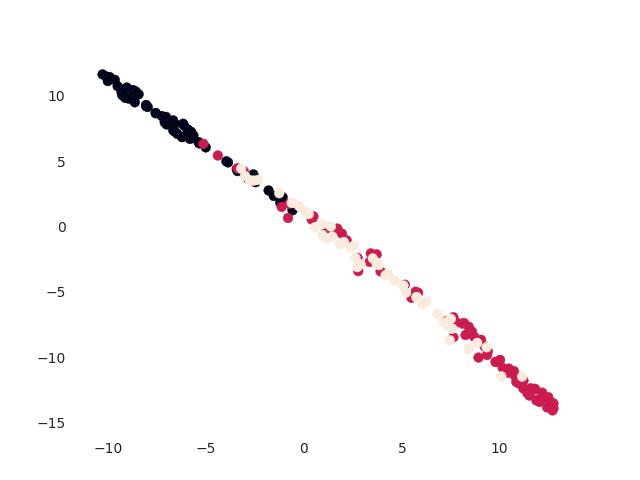

In [24]:
# Raw TSNE no feature transformation.
tsne = TSNE(random_state = 42)
reduced_ = tsne.fit_transform(X_df.values)

x, y = list(zip(*reduced_))
plt.scatter(x, y, c = labels)
plt.show()

<IPython.core.display.Javascript object>


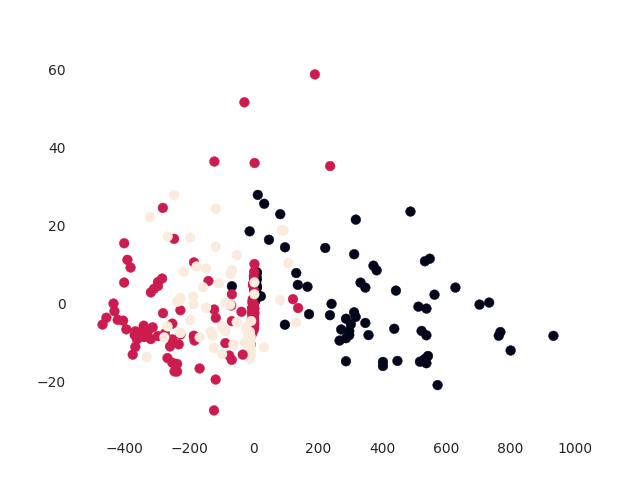

In [29]:
%matplotlib notebook
from sklearn.preprocessing import StandardScaler

# TSNE Feature Transformation
X_scaled = StandardScaler().fit_transform(X_df.values)

tsne = TSNE(random_state = 42)
reduced_ = tsne.fit_transform(X_scaled)
x, y = list(zip(*reduced_))
plt.scatter(x, y, c = labels)
plt.show()

<IPython.core.display.Javascript object>


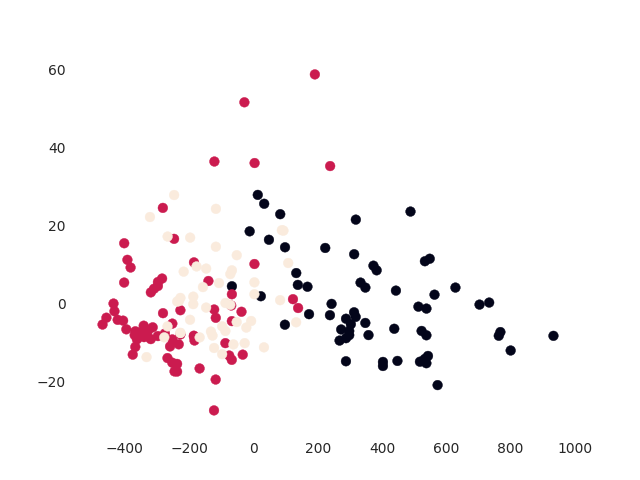

In [31]:
pca = PCA(n_components = 2, random_state = 42)
reduced_ = pca.fit_transform(X_df.values)

x, y = list(zip(*reduced_))
plt.scatter(x, y, c = labels)
plt.show()

## 3D

<IPython.core.display.Javascript object>


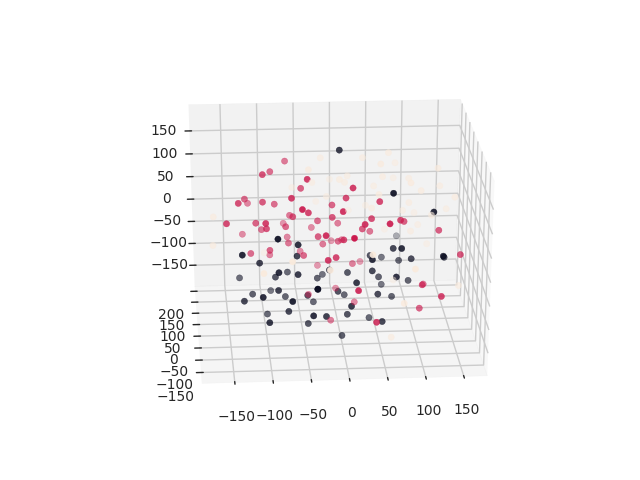

In [33]:
from mpl_toolkits.mplot3d import Axes3D 
ax = plt.axes(projection='3d')

tsne = TSNE(random_state = 42, n_components = 3)
reduced_ = tsne.fit_transform(X_scaled)
x, y,z = list(zip(*reduced_))
ax.scatter3D(x, y, z, c=labels);